<div class="usecase-title"><h3>Tree History</h3></div>

<div class="usecase-authors"><b>Authored by: </b> Venuka Hirushan Wijenayake</div>

<div class="usecase-authors"><b>Date: </b> T1 2024 (March - July)</div>

<div class="usecase-duration"><b>Duration:</b> 270 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Beginner/ Intermediate</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python, Power BI, Machine Learning</div>
</div>

<div class="usecase-section-header"><h3>Scenario<h3></div>

<p><strong>As a</strong> Master of Data Science student</p>
<p><strong>I want to</strong> conduct a comprehensive analysis of the diversity of tree species within the Melbourne area, comparing the current variety and density of tree species to historical data from pre-colonial times,</p>
<p><strong>So that I can</strong> identify significant changes and trends in tree diversity over time, specifically pinpointing species that have become less common or are on the verge of disappearing from the local ecosystem.</p>
<p><strong>This will help</strong> in making informed decisions about which species to prioritize in future tree planting programs, aiming to restore ecological balance, enhance urban biodiversity, and support sustainable urban development.</p>
<p><strong>By</strong> utilizing interactive mapping tools and temporal data visualization techniques, I hope to present this data in a clear and actionable manner to stakeholders and the public, ensuring the planning and execution of greening initiatives are well-supported by historical trends and current needs.</p>


<div class="usecase-section-header"><h3>Skills Demonstrated in the Tree Mapping Project</h3></div>

<ul>
  <li>
    <h5>1. Geospatial Analysis</h5>
    <ul>
      <li>
        Data Manipulation: Utilized Pandas and GeoPandas for transforming and preparing spatial data, crucial for mapping and analysis.
      </li>
      <li>
        Spatial Visualization: Employed Folium to create interactive maps that visualize geographic data, enhancing the understanding of spatial distribution and density of tree plantations.
      </li>
    </ul>
  </li>
  <li>
    <h5>2. Data Visualization</h5>
    <ul>
      <li>
        Interactive Mapping: Implemented interactive elements in maps using Folium, including tooltips and popups that provide more detailed information dynamically.
      </li>
      <li>
        Temporal Data Representation:** Integrated a time slider feature to visualize the temporal progression of tree planting, which illustrates changes over time and provides insights into urban greening efforts.
      </li>
    </ul>
  </li>
  <li>
    <h5>3. Programming and Technology</h5>
    <ul>
      <li>
        Python Programming:** Applied advanced Python programming techniques for data manipulation, analysis, and visualization, demonstrating strong coding skills.
      </li>
      <li>
        Use of Libraries and Plugins: Leveraged various Python libraries such as Folium, GeoPandas, and Pandas, along with plugins like MarkerCluster and Search to enhance the interactivity and functionality of the maps.
      </li>
    </ul>
  </li>
  <li>
    <h5>4. Critical Thinking and Problem Solving</h5>
    <ul>
      <li>
        Identification and Solution Design: Identified the need for specific types of data visualizations (e.g., clustering of markers, searchable interactive maps) and implemented solutions that address these requirements effectively.
      </li>
      <li>
        Optimization and Performance Tuning: Optimized the map's performance and user experience by clustering data points and using GeoJSON for efficient data handling and search capabilities.
      </li>
    </ul>
  </li>
  <li>
    <h5>5. Communication and Presentation</h5>
    <ul>
      <li>
        Clear Data Presentation: Designed maps that are not only functional but also user-friendly, ensuring that complex data is accessible and understandable to a broad audience.
      </li>
      <li>
        Documentation and Reporting: Crafted well-documented code and prepared comprehensive reports that explain the methodology, tools used, and insights derived from the data.
      </li>
    </ul>
  </li>
</ul>

<p>These skills are indicative of a well-rounded ability to handle, analyze, and present geospatial data in a manner that supports urban planning and environmental analysis, demonstrating both technical proficiency and analytical acumen.</p>

<div class="usecase-section-header"><h3>Project Goal: Melbourne Tree Species Analysis for Conservation Effort</h3></div>

<p>Conduct an in-depth analysis of the range of tree species in the Melbourne area, comparing historical data from pre-colonial times with current records. This study aims to identify changes in tree diversity, highlighting species that have diminished in numbers or variety. The ultimate goal is to provide evidence-based recommendations to local councils for tree planting programs, prioritizing species that need increased numbers to restore ecological balance and enhance urban biodiversity.</p>

<h4>Key Activities</h4>
<ul>
  <li>Historical Data Collection: Gather and analyze historical records and indigenous knowledge to identify the pre-colonial tree species composition.</li>
  <li>Current Species Survey: Utilize current botanical surveys, remote sensing data, and council records to compile an up-to-date list of tree species within Melbourne.</li>
  <li>Comparative Analysis: Compare historical and current data to identify trends, losses, or gains in tree species diversity.</li>
  <li>Recommendation Development: Based on the analysis, recommend tree species that need conservation focus and increased numbers in planting programs.</li>
</ul>

<h4>Expected Outcome</h4>
<p>A comprehensive report detailing changes in Melbourne's tree species over time, with actionable recommendations for local councils to inform future tree planting initiatives, aiming to restore lost tree species and enhance urban green spaces.</p>

<h4>Impact</h4>
<p>This project not only contributes to the conservation of Melbourne's botanical heritage but also supports urban sustainability efforts. By informing council tree planting programs with a focus on biodiversity, we can work towards a greener, more resilient Melbourne for future generations.</p>

<h4>Datasets</h4>
<div class="usecase-subsection-blurb">
  <i>1. Trees, with species and dimensions (Urban Forest) </i> 
  <br>
  <a href="https://data.melbourne.vic.gov.au/explore/dataset/trees-with-species-and-dimensions-urban-forest/information/" target="_blank">Link to Dataset 1</a>
  <br>
</div>
<br>
<div class="usecase-subsection-blurb">
  <i>2. Pre-colonial plant list </i> 
  <br>
  <a href="https://data.melbourne.vic.gov.au/explore/dataset/pre-colonial-plant-list/information/" target="_blank">Link to Dataset 2</a>
  <br>
</div>
<br>

## Installing all necessasory packages

In [1]:
!pip install requests pandas matplotlib-venn folium geopandas seaborn statsmodels

Defaulting to user installation because normal site-packages is not writeable


## Importing all the necessory libraries

In [2]:
import requests
import pandas as pd
import os
from matplotlib_venn import venn2
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster, FeatureGroupSubGroup
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA

In [3]:
def fetch_data(base_url, dataset, api_key, num_records=99, offset=0):
    all_records = []
    max_offset = 9900  # Maximum number of requests

    while True:
        # maximum limit check
        if offset > max_offset:
            break

        # Create API request URL
        filters = f'{dataset}/records?limit={num_records}&offset={offset}'
        url = f'{base_url}{filters}&api_key={api_key}'

        # Start request
        try:
            result = requests.get(url, timeout=10)
            result.raise_for_status()
            records = result.json().get('results')
        except requests.exceptions.RequestException as e:
            raise Exception(f"API request failed: {e}")
        if records is None:
            break
        all_records.extend(records)
        if len(records) < num_records:
            break

        # next cycle offset
        offset += num_records

    # DataFrame all data
    df = pd.DataFrame(all_records)
    return df

API_KEY = os.environ.get("API_KEY ")
# print("API Key:", API_KEY)
BASE_URL = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'

In [4]:
# data set name
PRE_COLONIAL_TREES = 'pre-colonial-plant-list'

pre_colonial_trees = fetch_data(BASE_URL, PRE_COLONIAL_TREES, API_KEY)

pre_colonial_trees

,species,common_name_s,certain,beach_and_dunes,saltmarsh,coastal_marshlands_and_brackish_flats,swamp_scrub,woodlands_and_heathlands_on_sand,woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges,grasslands_and_woodlands_on_fertile_plains,cliffs_and_escarpments,river_banks_and_creeklines,wet_heathland,freshwater_wetland,saltwater_wetland,most_likely_occurrence,epbc_category_of_threat,ffg_extinction_risk,ffg_category_of_threat
0,Acacia mucronata var. longifolia,"Narrow-leaf Wattle, Variable Sallow Wattle",NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1.0,None,None,None
1,Acacia pycnantha,Golden Wattle,1.0,0.0,0.0,0.0,1.0,2.1,3.2,3.1,2.1,2.1,0.0,0.0,0,3.2,None,None,None
2,Acacia verticillata var. verticillata,Prickly Moses,NaN,0.0,0.0,0.0,3.1,3.1,0.0,0.0,0.0,3.1,1.0,0.0,0,3.1,None,None,None
3,Acaena echinata,Sheep's Burr,1.0,0.0,0.0,0.0,0.0,1.0,3.1,3.1,3.1,2.1,0.0,0.0,0,3.1,None,None,None
4,Acrotriche prostrata,Trailing Ground-Berry,NaN,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1.0,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1062,Xanthorrhoea minor subsp. lutea,"Small Grass Tree, Toolimerin",NaN,0.0,0.0,0.0,0.0,2.1,1.0,0.0,0.0,0.0,0.0,0.0,0,2.1,None,None,None
1063,Xerochrysum bracteatum,"Golden Everlasting, Straw Flower",NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0,None,None,None
1064,Zostera muelleri subsp. capricorni,Eel-grass,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3.2,None,None,None
1065,Zostera muelleri subsp. muelleri,Dwarf Grass-wrack,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2.2,None,None,None


In [5]:
# data set name
CURRENT_TREES = 'trees-with-species-and-dimensions-urban-forest'

current_trees = fetch_data(BASE_URL, CURRENT_TREES, API_KEY)

current_trees

,com_id,common_name,scientific_name,genus,family,diameter_breast_height,year_planted,date_planted,age_description,useful_life_expectency,useful_life_expectency_value,precinct,located_in,uploaddate,coordinatelocation,latitude,longitude,easting,northing,geolocation
0,1546404,River Sheoak,Casuarina cunninghamiana,Casuarina,Casuarinaceae,NaN,2013,2013-01-07,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.97177997020128, 'lat': -37.8180699...",-37.818070,144.971780,321479.34,5812432.31,"{'lon': 144.97177997020128, 'lat': -37.8180699..."
1,1038666,Claret Ash,Fraxinus angustifolia subsp. oxycarpa,Fraxinus,Oleaceae,26.0,1998,1998-11-09,Semi-Mature,11-20 years,20.0,None,Park,2021-01-10,"{'lon': 144.96069216093832, 'lat': -37.7815772...",-37.781577,144.960692,320414.93,5816460.51,"{'lon': 144.96069216093832, 'lat': -37.7815772..."
2,1439845,Kanooka,Tristaniopsis laurina,Tristaniopsis,Myrtaceae,NaN,2009,2009-09-08,None,None,NaN,None,Street,2021-01-10,"{'lon': 144.9455194257097, 'lat': -37.79259845...",-37.792598,144.945519,319105.53,5815208.27,"{'lon': 144.9455194257097, 'lat': -37.79259845..."
3,1070962,Spotted Gum,Corymbia maculata,Corymbia,Myrtaceae,17.0,2007,2007-06-14,Semi-Mature,31-60 years,60.0,None,Street,2021-01-10,"{'lon': 144.9421772126995, 'lat': -37.78013819...",-37.780138,144.942177,318780.78,5816584.46,"{'lon': 144.9421772126995, 'lat': -37.78013819..."
4,1066252,River red gum,Eucalyptus camaldulensis,Eucalyptus,Myrtaceae,19.0,2006,2006-02-20,Semi-Mature,61+ years,80.0,None,Street,2021-01-10,"{'lon': 144.92039340703647, 'lat': -37.7905765...",-37.790577,144.920393,316887.98,5815383.70,"{'lon': 144.92039340703647, 'lat': -37.7905765..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1066718,Yellow Box,Eucalyptus melliodora,Eucalyptus,Myrtaceae,NaN,2006,2006-09-14,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.9546546149572, 'lat': -37.78488602...",-37.784886,144.954655,319891.23,5816081.73,"{'lon': 144.9546546149572, 'lat': -37.78488602..."
9995,1735402,Manuka,Kunzea ericoides,Kunzea,Myrtaceae,NaN,2018,2018-05-30,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.9514066985289, 'lat': -37.79316880...",-37.793169,144.951407,319625.34,5815156.36,"{'lon': 144.9514066985289, 'lat': -37.79316880..."
9996,1656707,Norfolk Island Pine,Araucaria heterophylla,Araucaria,Araucariaceae,NaN,2017,2017-04-26,None,None,NaN,None,Street,2021-01-10,"{'lon': 144.9471755893213, 'lat': -37.81988993...",-37.819890,144.947176,319317.91,5812183.04,"{'lon': 144.9471755893213, 'lat': -37.81988993..."
9997,1604462,Lightwood Wattle,Acacia implexa,Acacia,Fabaceae,NaN,2015,2015-08-25,None,None,NaN,None,Park,2021-01-10,"{'lon': 144.9524311587096, 'lat': -37.79529060...",-37.795291,144.952431,319720.71,5814922.89,"{'lon': 144.9524311587096, 'lat': -37.79529060..."


## Preprocess the Data

### Displaying Available Columns

In [6]:
# Print available columns in the pre-colonial trees cleaned dataset
print("Available columns in pre-colonial trees dataset:")
print(pre_colonial_trees.columns.tolist())

# Print available columns in the current trees cleaned dataset
print("\nAvailable columns in current trees dataset:")
print(current_trees.columns.tolist())

Available columns in pre-colonial trees dataset:
['species', 'common_name_s', 'certain', 'beach_and_dunes', 'saltmarsh', 'coastal_marshlands_and_brackish_flats', 'swamp_scrub', 'woodlands_and_heathlands_on_sand', 'woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges', 'grasslands_and_woodlands_on_fertile_plains', 'cliffs_and_escarpments', 'river_banks_and_creeklines', 'wet_heathland', 'freshwater_wetland', 'saltwater_wetland', 'most_likely_occurrence', 'epbc_category_of_threat', 'ffg_extinction_risk', 'ffg_category_of_threat']

Available columns in current trees dataset:
['com_id', 'common_name', 'scientific_name', 'genus', 'family', 'diameter_breast_height', 'year_planted', 'date_planted', 'age_description', 'useful_life_expectency', 'useful_life_expectency_value', 'precinct', 'located_in', 'uploaddate', 'coordinatelocation', 'latitude', 'longitude', 'easting', 'northing', 'geolocation']


### Code Explanation

This code block is used to print the available columns in two datasets: `pre_colonial_trees` and `current_trees`. These datasets are assumed to contain data on trees from pre-colonial times and the current period, respectively. The following steps are taken:

1. **Print a Header for Pre-Colonial Trees Dataset Columns**:
   - A message `"Available columns in pre-colonial trees dataset:"` is printed to indicate that the subsequent output will list the columns from the `pre_colonial_trees` dataset.

2. **List Columns of the Pre-Colonial Trees Dataset**:
   - The `columns` attribute of the `pre_colonial_trees` DataFrame is accessed to retrieve the list of columns, and `tolist()` is called on this to convert it to a list format, which is then printed. This shows which data fields are available in the dataset concerning trees from the pre-colonial era.

3. **Print a Header for Current Trees Dataset Columns**:
   - After a newline for better readability, a message `"Available columns in current trees dataset:"` is printed to introduce the columns list for the `current_trees` dataset.

4. **List Columns of the Current Trees Dataset**:
   - Similarly, the `columns` attribute for the `current_trees` DataFrame is accessed and converted to a list format to display the available columns. This list represents the fields available in the dataset that contains information on trees from the current period.
   
These steps help in understanding the structure of the datasets and prepare for further data manipulation or analysis tasks.


### Removing unwanted columns

In [7]:
# Columns to remove from the pre-colonial dataset
columns_to_remove_pre_colonial = ['epbc_category_of_threat', 'ffg_extinction_risk', 'ffg_category_of_threat', 'certain']

# Removing the specified columns from the pre-colonial trees dataset
pre_colonial_trees_cleaned = pre_colonial_trees.drop(columns=columns_to_remove_pre_colonial)

# Print available columns in the pre-colonial trees cleaned dataset after removal
print("Available columns in pre-colonial trees dataset after removal:")
print(pre_colonial_trees_cleaned.columns.tolist())

# Columns to remove from the current trees dataset
columns_to_remove_current = ['age_description', 'useful_life_expectency', 'useful_life_expectency_value', 'precinct', 'diameter_breast_height', 'coordinatelocation', 'easting', 'northing', 'geolocation']

# Removing the specified columns from the current trees dataset
current_trees_cleaned = current_trees.drop(columns=columns_to_remove_current)

# Print available columns in the current trees cleaned dataset after removal
print("\nAvailable columns in current trees dataset after removal:")
print(current_trees_cleaned.columns.tolist())

Available columns in pre-colonial trees dataset after removal:
['species', 'common_name_s', 'beach_and_dunes', 'saltmarsh', 'coastal_marshlands_and_brackish_flats', 'swamp_scrub', 'woodlands_and_heathlands_on_sand', 'woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges', 'grasslands_and_woodlands_on_fertile_plains', 'cliffs_and_escarpments', 'river_banks_and_creeklines', 'wet_heathland', 'freshwater_wetland', 'saltwater_wetland', 'most_likely_occurrence']

Available columns in current trees dataset after removal:
['com_id', 'common_name', 'scientific_name', 'genus', 'family', 'year_planted', 'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude']


### Code Explanation

This code block focuses on cleaning up datasets by removing specific columns deemed unnecessary for the analysis from two separate datasets: `pre_colonial_trees` and `current_trees`. Here's a detailed step-by-step breakdown:

1. **Importing the pandas Library**:
   - The code begins with importing the `pandas` library, which is essential for data manipulation and analysis in Python, particularly for working with dataframes.

2. **Defining Columns to Remove from Pre-Colonial Dataset**:
   - A list named `columns_to_remove_pre_colonial` is created, containing the names of the columns to be removed from the `pre_colonial_trees` dataset. These columns include data on threat categories and extinction risk which are presumably not required for the intended analysis.

3. **Removing Specified Columns from Pre-Colonial Trees Dataset**:
   - Using the `drop()` method from pandas, the specified columns are removed from the `pre_colonial_trees` dataframe, and the resulting dataframe is stored in `pre_colonial_trees_cleaned`.

4. **Print Available Columns in the Cleaned Pre-Colonial Trees Dataset**:
   - The columns of the cleaned `pre_colonial_trees_cleaned` dataframe are printed to verify that the unwanted columns have been successfully removed.

5. **Defining Columns to Remove from Current Trees Dataset**:
   - Similarly, a list named `columns_to_remove_current` is created for the `current_trees` dataset. This list includes columns related to age, life expectancy, and geographical data that are not needed for further analysis.

6. **Removing Specified Columns from Current Trees Dataset**:
   - The `drop()` method is used again to remove the listed columns from the `current_trees` dataframe. The cleaned dataframe is stored in `current_trees_cleaned`.

7. **Print Available Columns in the Cleaned Current Trees Dataset**:
   - Finally, the columns of the `current_trees_cleaned` dataframe are printed to confirm the removal of the specified columns.

These operations are essential for refining the datasets by eliminating irrelevant data, thereby simplifying future data processing and analysis tasks.


### Printing Available Columns after Removing Unwanted Columns

In [8]:
# Print available columns in the pre-colonial trees cleaned dataset
print("Available columns in pre-colonial trees dataset:")
print(pre_colonial_trees_cleaned.columns.tolist())

# Print available columns in the current trees cleaned dataset
print("\nAvailable columns in current trees dataset:")
print(current_trees_cleaned.columns.tolist())

Available columns in pre-colonial trees dataset:
['species', 'common_name_s', 'beach_and_dunes', 'saltmarsh', 'coastal_marshlands_and_brackish_flats', 'swamp_scrub', 'woodlands_and_heathlands_on_sand', 'woodlands_and_forests_on_sedimentary_hills_valleys_and_ridges', 'grasslands_and_woodlands_on_fertile_plains', 'cliffs_and_escarpments', 'river_banks_and_creeklines', 'wet_heathland', 'freshwater_wetland', 'saltwater_wetland', 'most_likely_occurrence']

Available columns in current trees dataset:
['com_id', 'common_name', 'scientific_name', 'genus', 'family', 'year_planted', 'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude']


### Code Explanation

This code block is used to display the columns available in two cleaned datasets: `pre_colonial_trees_cleaned` and `current_trees_cleaned`. These datasets have been previously cleaned by removing specific columns not required for further analysis. The code consists of simple print statements organized as follows:

1. **Print a Header for Cleaned Pre-Colonial Trees Dataset Columns**:
   - The first print statement outputs a header: `"Available columns in pre-colonial trees dataset:"`. This serves as an introduction to the list of columns that will follow, indicating that these columns pertain to the dataset with pre-colonial tree data after certain columns have been removed.

2. **List Columns of the Cleaned Pre-Colonial Trees Dataset**:
   - The `columns` attribute of the `pre_colonial_trees_cleaned` DataFrame is accessed to obtain the list of remaining columns. The `tolist()` method is used to convert this information into a list format, which is then printed. This shows the columns that are still available for use after the initial cleaning.

3. **Print a Header for Cleaned Current Trees Dataset Columns**:
   - A newline is printed for clear separation, followed by another header: `"Available columns in current trees dataset:"`. This indicates that the upcoming list will detail the columns available in the dataset containing current period tree data after it has been cleaned.

4. **List Columns of the Cleaned Current Trees Dataset**:
   - Similar to the previous dataset, the `columns` attribute for the `current_trees_cleaned` DataFrame is accessed. The remaining columns are listed in a similar fashion, outlining what data fields are still available for analysis.

These printed lists help in verifying that the correct columns have been removed as intended and confirm what data is available for further steps in the analysis or modeling processes.


### Renaming Columns to Match Datasets

In [9]:
# Rename "Scientific Name" column to "Species" in the current trees dataset
current_trees_renamed = current_trees_cleaned.rename(columns={"scientific_name": "species"})

# Verify the column renaming by printing the columns of the updated DataFrame
print("Available columns in current trees dataset after renaming:")
print(current_trees_renamed.columns.tolist())


Available columns in current trees dataset after renaming:
['com_id', 'common_name', 'species', 'genus', 'family', 'year_planted', 'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude']


## Analysis & Visualization

In [10]:
current_trees_renamed

,com_id,common_name,species,genus,family,year_planted,date_planted,located_in,uploaddate,latitude,longitude
0,1546404,River Sheoak,Casuarina cunninghamiana,Casuarina,Casuarinaceae,2013,2013-01-07,Park,2021-01-10,-37.818070,144.971780
1,1038666,Claret Ash,Fraxinus angustifolia subsp. oxycarpa,Fraxinus,Oleaceae,1998,1998-11-09,Park,2021-01-10,-37.781577,144.960692
2,1439845,Kanooka,Tristaniopsis laurina,Tristaniopsis,Myrtaceae,2009,2009-09-08,Street,2021-01-10,-37.792598,144.945519
3,1070962,Spotted Gum,Corymbia maculata,Corymbia,Myrtaceae,2007,2007-06-14,Street,2021-01-10,-37.780138,144.942177
4,1066252,River red gum,Eucalyptus camaldulensis,Eucalyptus,Myrtaceae,2006,2006-02-20,Street,2021-01-10,-37.790577,144.920393
...,...,...,...,...,...,...,...,...,...,...,...
9994,1066718,Yellow Box,Eucalyptus melliodora,Eucalyptus,Myrtaceae,2006,2006-09-14,Park,2021-01-10,-37.784886,144.954655
9995,1735402,Manuka,Kunzea ericoides,Kunzea,Myrtaceae,2018,2018-05-30,Park,2021-01-10,-37.793169,144.951407
9996,1656707,Norfolk Island Pine,Araucaria heterophylla,Araucaria,Araucariaceae,2017,2017-04-26,Street,2021-01-10,-37.819890,144.947176
9997,1604462,Lightwood Wattle,Acacia implexa,Acacia,Fabaceae,2015,2015-08-25,Park,2021-01-10,-37.795291,144.952431


### 1. Historical vs. Current Species Diversity (Venn Diagram)

In [11]:
!pip install matplotlib-venn

Defaulting to user installation because normal site-packages is not writeable


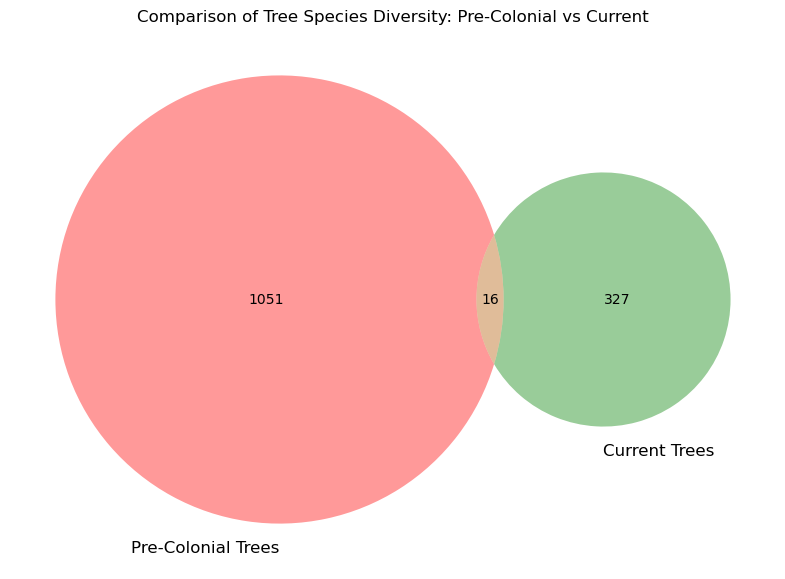

In [12]:
# Extracting species lists from both datasets
pre_colonial_species = set(pre_colonial_trees_cleaned['species'].unique())
current_species = set(current_trees_renamed['species'].unique())

# Creating the Venn diagram
plt.figure(figsize=(10, 7))
venn2([pre_colonial_species, current_species], ('Pre-Colonial Trees', 'Current Trees'))
plt.title('Comparison of Tree Species Diversity: Pre-Colonial vs Current')
plt.show()

### Code Explanation

This code generates a Venn diagram to compare the species diversity between pre-colonial and current tree datasets:

1. **Importing Libraries**:
   - `matplotlib_venn` for creating Venn diagrams and `matplotlib.pyplot` for plotting.

2. **Extracting Species Lists**:
   - Unique species from each dataset are extracted and converted into sets. This allows for set operations needed for Venn diagrams.

3. **Setting Up Venn Diagram**:
   - A figure is created with specified dimensions. The `venn2` function is used to plot a Venn diagram using the species sets, with labels indicating the datasets they represent.

4. **Displaying the Diagram**:
   - A title is added, and `plt.show()` is called to display the Venn diagram, visually representing the overlap and differences in species between the two datasets.


### 2. Change in Species Abundance Over Time

In [13]:
# Extract species sets
pre_colonial_species = set(pre_colonial_trees_cleaned['species'].unique())
current_species = set(current_trees_renamed['species'].unique())

# Determine shared and unique species
shared_species = pre_colonial_species.intersection(current_species)
lost_species = pre_colonial_species.difference(current_species)
gained_species = current_species.difference(pre_colonial_species)

# Print results
print(f"Shared Species: {len(shared_species)}")
print(f"Lost Species: {len(lost_species)}")
print(f"Gained Species: {len(gained_species)}")

Shared Species: 16
Lost Species: 1051
Gained Species: 327


### Code Explanation

This code block analyzes the species diversity changes over time by comparing species from pre-colonial and current tree datasets:

1. **Extracting Species Sets**:
   - Unique species are extracted from each dataset and stored as sets. This facilitates the use of set operations to find common and unique species.

2. **Finding Shared and Unique Species**:
   - `intersection()` is used to identify species present in both datasets (`shared_species`).
   - `difference()` is used to find species that were present only in the pre-colonial dataset (`lost_species`) and only in the current dataset (`gained_species`).

3. **Printing Results**:
   - The counts of shared, lost, and gained species are printed, providing a quantitative comparison of species diversity changes from pre-colonial times to the present.

### 3. Geographical Distribution of Trees (Map Visualization)

In [14]:
# Convert DataFrame to GeoDataFrame
gdf = gpd.GeoDataFrame(
    current_trees_renamed,
    geometry=gpd.points_from_xy(current_trees_renamed.longitude, current_trees_renamed.latitude),
    crs="EPSG:4326"
)

# Initialize a map centered around Melbourne
melbourne_map = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)

# Use MarkerCluster to manage multiple markers
marker_cluster = MarkerCluster().add_to(melbourne_map)

# Create FeatureGroupSubGroups for parks and streets within the MarkerCluster
park_group = FeatureGroupSubGroup(marker_cluster, 'Parks')
street_group = FeatureGroupSubGroup(marker_cluster, 'Streets')
park_group.add_to(melbourne_map)
street_group.add_to(melbourne_map)

# Add markers to the appropriate subgroup based on their location
for idx, row in gdf.iterrows():
    marker = folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=3,
        color='green' if row['located_in'] == 'Park' else 'red',
        fill=True,
        fill_color='green' if row['located_in'] == 'Park' else 'red',
        popup=f"Species: {row['species']}, Planted: {row['date_planted']}"
    )
    if row['located_in'] == 'Park':
        marker.add_to(park_group)
    else:
        marker.add_to(street_group)

# Add LayerControl to toggle parks and streets
folium.LayerControl().add_to(melbourne_map)

# Display the map
melbourne_map

### Code Explanation

This code block uses the `folium` library to visualize geographical data, specifically to map the locations of trees in Melbourne on different types of sites (parks vs streets):

1. **Importing Libraries**:
   - Libraries `folium` for mapping, `pandas` for data manipulation, and `geopandas` for geographical data operations are imported.

2. **Converting DataFrame to GeoDataFrame**:
   - The `current_trees_renamed` DataFrame is converted into a `GeoDataFrame` using `geopandas`. This involves creating geometry points from longitude and latitude columns and setting the coordinate reference system to "EPSG:4326" (WGS 84).

3. **Initializing the Map**:
   - A `folium` map centered around Melbourne is created with a starting zoom level that provides a city-wide view.

4. **Using MarkerCluster**:
   - A `MarkerCluster` is added to the map to manage multiple markers efficiently, improving performance and usability by clustering nearby markers at similar zoom levels.

5. **Creating FeatureGroupSubGroups**:
   - Subgroups for parks and streets are created under the main marker cluster, allowing these categories to be toggled on and off in the map view.

6. **Adding Markers**:
   - Markers are added for each tree. The color and popup content are set based on the tree's location type and other attributes. Trees in parks are marked in green, while those in streets are in red.

7. **Adding LayerControl**:
   - A layer control is added to the map, allowing users to switch between viewing trees in parks and streets.

8. **Displaying the Map**:
   - Finally, the map is displayed with all markers and controls in place, providing a visual tool for analyzing the spatial distribution of tree species across Melbourne.

This visual representation helps in understanding the geographic distribution and context of urban flora data, useful for urban planning, ecological studies, or public information purposes.


### 4. Time-Series Analysis of Tree Planting

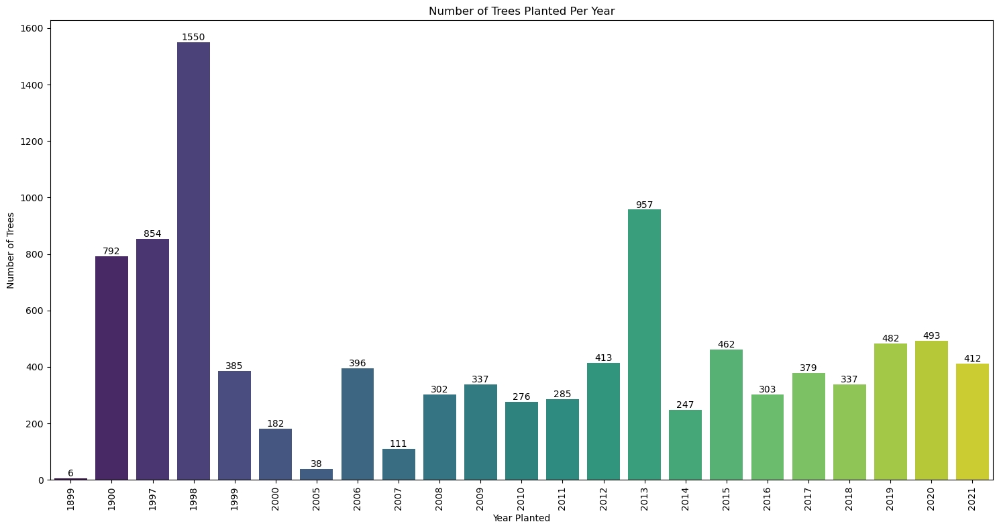

In [15]:
# Ensure the 'year_planted' column is treated as integers
current_trees_renamed['year_planted'] = pd.to_numeric(current_trees_renamed['year_planted'], errors='coerce')

# Filtering out any rows where 'year_planted' might be zero or invalid
current_trees_filtered = current_trees_renamed[current_trees_renamed['year_planted'] > 0]

# Create the plot
plt.figure(figsize=(15, 8))
ax = sns.countplot(x='year_planted', data=current_trees_filtered, palette='viridis')
plt.xticks(rotation=90)
plt.title('Number of Trees Planted Per Year')
plt.ylabel('Number of Trees')
plt.xlabel('Year Planted')

# Adding counts above the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.tight_layout()
plt.show()

### Code Explanation

This code block creates a bar plot using `seaborn` and `matplotlib` to visualize the number of trees planted each year in a given dataset:

1. **Importing Libraries**:
   - Libraries `seaborn`, `matplotlib.pyplot`, and `pandas` are imported for data visualization and manipulation.

2. **Cleaning Year Data**:
   - The `year_planted` column in `current_trees_renamed` is converted to numeric type, treating any non-numeric values as `NaN` (`errors='coerce'`). This ensures all data in this column are valid integers or `NaN`.

3. **Filtering Invalid Data**:
   - Rows with a `year_planted` value of zero or `NaN` are removed, ensuring the dataset only includes valid years.

4. **Creating the Plot**:
   - A figure is initialized with a specified size, and a bar plot is created using `seaborn.countplot` to count occurrences of each `year_planted` value. The `viridis` color palette is used for visual appeal.

5. **Formatting the Plot**:
   - The x-axis labels (years) are rotated 90 degrees to prevent overlapping and enhance readability. Titles and labels for axes are set to provide context to the plot.

6. **Adding Counts above Bars**:
   - An annotation is added above each bar displaying its height (count of trees), which aids in interpreting the plot directly without referring to the y-axis for counts.

7. **Finalizing and Displaying the Plot**:
   - `plt.tight_layout()` adjusts the layout to make sure there's no clipping of tick labels or other important elements. The plot is then displayed with `plt.show()`.

This visualization offers a clear and immediate understanding of tree-planting trends over the years, which can be valuable for ecological studies, urban planning, or community awareness initiatives.

### 5. Habitat Analysis for Pre-Colonial Species

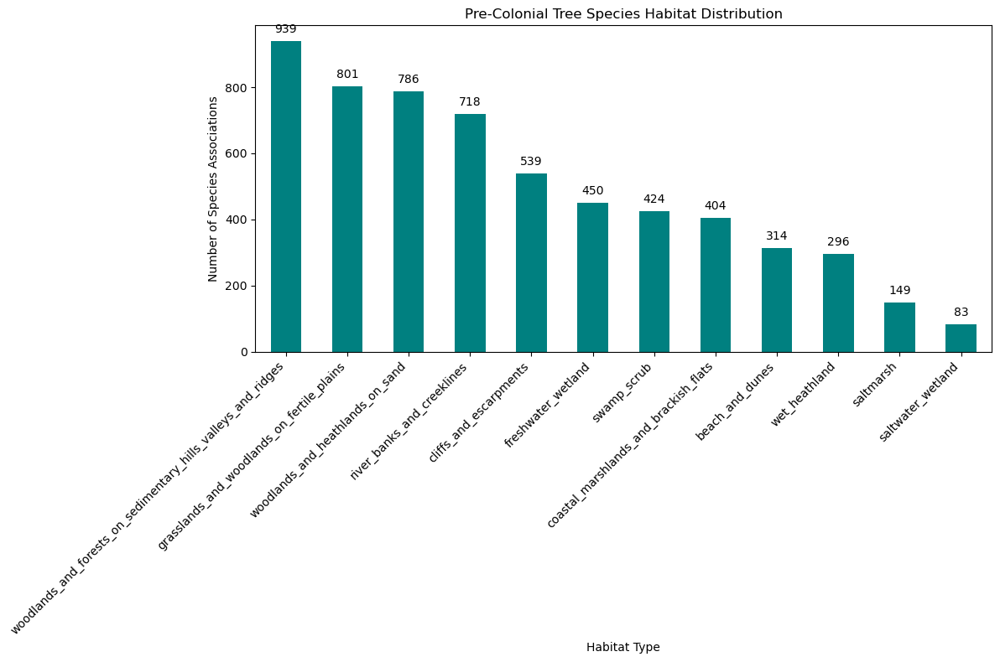

In [16]:
# Summing up habitat data
habitat_data = pre_colonial_trees_cleaned.drop(columns=['species', 'common_name_s', 'most_likely_occurrence'])
habitat_totals = habitat_data.sum().sort_values(ascending=False)

# Plotting habitat data
plt.figure(figsize=(12, 8))  # Adjusted figure size for better fit
habitat_totals = habitat_data.sum().sort_values(ascending=False)
ax = habitat_totals.plot(kind='bar', color='teal')
plt.title('Pre-Colonial Tree Species Habitat Distribution')
plt.ylabel('Number of Species Associations')
plt.xlabel('Habitat Type')
plt.xticks(rotation=45, ha='right')  # Adjust label alignment and rotation
plt.tight_layout()  # Adjust layout to make room for label text

# Adding text annotations at the top of each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', color='black', xytext=(0, 5), textcoords='offset points')

plt.show()

### Code Explanation

This code block uses `matplotlib.pyplot` to create a bar chart visualizing the distribution of habitat associations for tree species from the pre-colonial period:

1. **Summing Up Habitat Data**:
   - Unnecessary columns like `species`, `common_name_s`, and `most_likely_occurrence` are dropped from the `pre_colonial_trees_cleaned` dataset. The remaining columns, which presumably represent different habitat types, are then summed. This summing operation tallies the number of species associations for each habitat type.

2. **Plotting Habitat Data**:
   - A figure is initialized with specified dimensions for clarity. The summed habitat data is plotted as a bar chart where each bar represents a habitat type. The bars are colored in teal for visual consistency.

3. **Formatting the Plot**:
   - A title and axis labels are added to contextualize the data. The x-axis labels (habitat types) are rotated 45 degrees and aligned to the right to enhance readability and fit the labels within the plot area.

4. **Adding Annotations**:
   - Annotations displaying the numeric value of each bar are added. These are positioned at the top of the bars, making it easier to see the exact values without referencing the y-axis scale. This is particularly useful in printed formats or presentations where detailed examination of the plot is necessary.

5. **Final Adjustments and Display**:
   - `plt.tight_layout()` is called to automatically adjust subplot parameters, ensuring that everything fits within the figure area without any overlap. The plot is then displayed with `plt.show()`.

This visualization effectively communicates the relative prevalence of different habitats associated with tree species in pre-colonial times, providing insights into historical biodiversity that can inform conservation efforts.


### 6. Ecological Dynamics of Tree Species in Parks vs. Streets in Melbourne

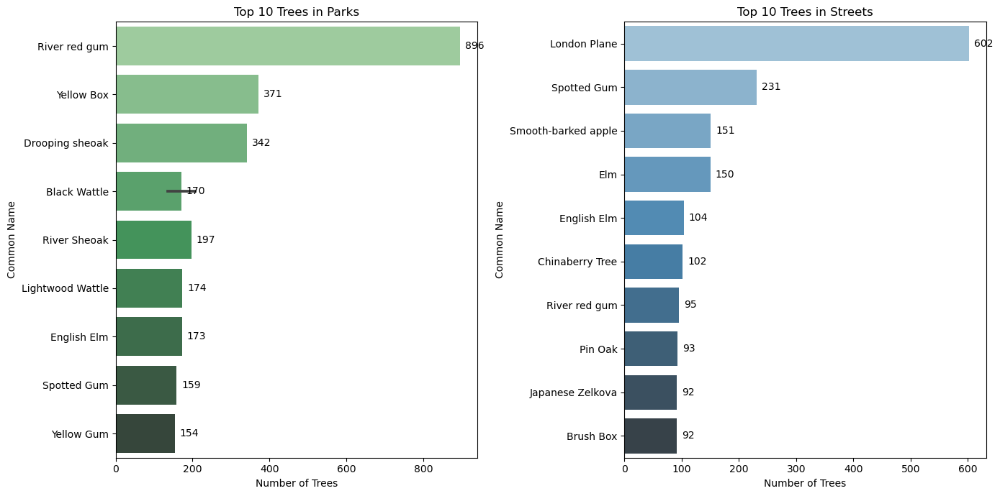

Trees in Parks:
                     common_name                                  species  count
                   River red gum                 Eucalyptus camaldulensis    896
                      Yellow Box                    Eucalyptus melliodora    371
                 Drooping sheoak               Allocasuarina verticillata    342
                    Black Wattle                          Acacia mearnsii    206
                    River Sheoak                 Casuarina cunninghamiana    197
                Lightwood Wattle                           Acacia implexa    174
                     English Elm                            Ulmus procera    173
                     Spotted Gum                        Corymbia maculata    159
                      Yellow Gum                    Eucalyptus leucoxylon    154
                    Black Wattle                       Acacia melanoxylon    135
                  Sweet Bursaria                         Bursaria spinosa    130
            

In [17]:
# Separate trees into parks and streets
trees_in_parks = current_trees_renamed[current_trees_renamed['located_in'] == 'Park']
trees_in_streets = current_trees_renamed[current_trees_renamed['located_in'] == 'Street']

# Focus on common names and species for simplicity
parks_info = trees_in_parks[['common_name', 'species']].value_counts().reset_index(name='count')
streets_info = trees_in_streets[['common_name', 'species']].value_counts().reset_index(name='count')

# Visualization of Species Distribution with Counts
plt.figure(figsize=(14, 7))

# Trees in Parks
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='count', y='common_name', data=parks_info.head(10), palette='Greens_d')
plt.title('Top 10 Trees in Parks')
plt.xlabel('Number of Trees')
plt.ylabel('Common Name')
# Add counts above the bars
for p in ax1.patches:
    ax1.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + p.get_height() / 2),
                 ha='left', va='center', xytext=(5, 0), textcoords='offset points')

# Trees in Streets
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='count', y='common_name', data=streets_info.head(10), palette='Blues_d')
plt.title('Top 10 Trees in Streets')
plt.xlabel('Number of Trees')
plt.ylabel('Common Name')
# Add counts above the bars
for p in ax2.patches:
    ax2.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + p.get_height() / 2),
                 ha='left', va='center', xytext=(5, 0), textcoords='offset points')

plt.tight_layout()
plt.show()

# Print the lists of trees in parks and streets
print("Trees in Parks:")
print(parks_info.to_string(index=False))

print("\nTrees in Streets:")
print(streets_info.to_string(index=False))


### Code Explanation

This code block utilizes `pandas`, `matplotlib.pyplot`, and `seaborn` to analyze and visualize the distribution of tree species located in parks and streets from a dataset:

1. **Data Segregation**:
   - The dataset `current_trees_renamed` is divided based on the location of trees, segregating those located in parks and streets. This allows for focused analysis on the ecological and urban planning aspects of these areas.

2. **Data Aggregation**:
   - For each subset (parks and streets), the combination of `common_name` and `species` is counted to determine the frequency of each tree type. The result is sorted by frequency and reset to a new DataFrame with a `count` column.

3. **Visualization Setup**:
   - A figure with two subplots is created to compare the top 10 most common trees in parks and streets. The horizontal bar plot format is chosen for better visualization of tree names.

4. **Plotting Tree Distribution**:
   - Two `seaborn.barplot` calls visualize the data. The first plot shows trees in parks with a green color scheme, while the second shows trees in streets using a blue palette. Both plots display the number of trees for the top 10 most common names.

5. **Annotations on Plots**:
   - Text annotations are added to the bar plots to display the exact counts of trees next to each bar, enhancing readability and providing quick insights at a glance.

6. **Final Adjustments and Display**:
   - `plt.tight_layout()` is applied to adjust the subplot layouts so that the labels and titles do not overlap or clip. The plot is then displayed with `plt.show()`.

7. **Printing Data**:
   - Finally, the detailed lists of the top trees in both parks and streets are printed, giving a textual representation of the visual data for reference or further analysis.

This approach not only highlights the most prevalent tree types in urban and park environments but also provides a clear visual and textual representation of urban forestry distribution, which can be crucial for urban environmental planning and public understanding.


### Identify Lost Species

In [18]:
# Set of species in the pre-colonial dataset
pre_colonial_species_set = set(pre_colonial_trees_cleaned['species'])

# Set of species in the current dataset
current_species_set = set(current_trees_renamed['species'])

# Find species that are lost (present in pre-colonial but not in current)
lost_species_set = pre_colonial_species_set.difference(current_species_set)

# Filter the pre-colonial dataset to get the common names of these lost species
lost_species_details = pre_colonial_trees_cleaned[pre_colonial_trees_cleaned['species'].isin(lost_species_set)][['species', 'common_name_s']]

# Print the lost species and their common names
print("Lost Species and Their Common Names:")
print(lost_species_details)

Lost Species and Their Common Names:
                                    species  \
0          Acacia mucronata var. longifolia   
2     Acacia verticillata var. verticillata   
3                           Acaena echinata   
4                      Acrotriche prostrata   
5                      Acrotriche serrulata   
...                                     ...   
1062        Xanthorrhoea minor subsp. lutea   
1063                 Xerochrysum bracteatum   
1064     Zostera muelleri subsp. capricorni   
1065       Zostera muelleri subsp. muelleri   
1066               Zygophyllum billardierei   

                                   common_name_s  
0     Narrow-leaf Wattle, Variable Sallow Wattle  
2                                  Prickly Moses  
3                                   Sheep's Burr  
4                          Trailing Ground-Berry  
5                                     Honey Pots  
...                                          ...  
1062                Small Grass Tree, Too

### Code Explanation

This code block focuses on identifying tree species that were present in pre-colonial times but are no longer found in the current dataset, highlighting potential biodiversity loss:

1. **Creating Sets of Species**:
   - The species from both the `pre_colonial_trees_cleaned` and `current_trees_renamed` datasets are converted into sets. This conversion facilitates efficient set operations to identify differences between the two datasets.

2. **Identifying Lost Species**:
   - The `difference()` method is used on the pre-colonial species set to find species that are in the pre-colonial dataset but not in the current dataset. The resulting set, `lost_species_set`, contains species that are potentially extinct or no longer found in the surveyed area.

3. **Filtering for Detailed Information**:
   - The pre-colonial dataset is filtered to include only those species found in the `lost_species_set`. This subset, `lost_species_details`, is created to gather additional details, particularly the common names (`common_name_s`), of these lost species.

4. **Printing Lost Species Details**:
   - The lost species along with their common names are printed. This provides valuable information for conservation efforts, ecological studies, and public awareness about species that have disappeared from the local flora over time.

This analysis is crucial for understanding changes in biodiversity and could be a cornerstone for ecological conservation strategies, allowing stakeholders to pinpoint specific species that require attention.

In [19]:
# Print the shape of each dataset
print("Shape of Current Trees Renamed Dataset:", current_trees_renamed.shape)
print("Shape of Pre-Colonial Trees Cleaned Dataset:", pre_colonial_trees_cleaned.shape)


Shape of Current Trees Renamed Dataset: (9999, 11)
Shape of Pre-Colonial Trees Cleaned Dataset: (1067, 15)


### Timeseries Model Fitting (ARIMA Model Forecasting)

In [20]:
# Print all column names in the DataFrame to verify the correct name of the year_planted column
print(current_trees_renamed.columns)


Index(['com_id', 'common_name', 'species', 'genus', 'family', 'year_planted',
       'date_planted', 'located_in', 'uploaddate', 'latitude', 'longitude'],
      dtype='object')


#### Step 1: Data Preparation

In [21]:
# Make sure 'year' is a datetime object and extract the year if it's not just the year number
current_trees_renamed['year_planted'] = pd.to_datetime(current_trees_renamed['year_planted'], format='%Y').dt.year

# Aggregate data by year to get the total count of trees planted each year
yearly_data = current_trees_renamed.groupby('year_planted').size().reset_index(name='Tree_Count')
yearly_data.set_index('year_planted', inplace=True)  # Set the year as the index, ensuring it is a datetime index for time series modeling
yearly_data.index = pd.to_datetime(yearly_data.index, format='%Y')


#### Step 2: Visualize the Data

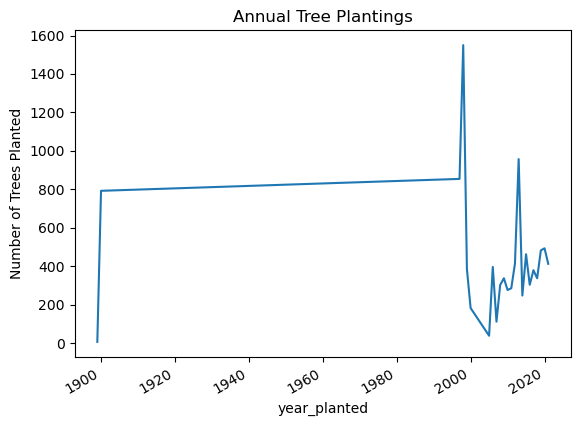

In [22]:
yearly_data['Tree_Count'].plot(title='Annual Tree Plantings')
plt.ylabel('Number of Trees Planted')
plt.show()


#### Step 3: Check for Stationarity

In [23]:
result = adfuller(yearly_data['Tree_Count'])
print('ADF Statistic:', result[0])
print('p-value:', result[1])

# Interpret the p-value
if result[1] < 0.05:
    print("Data is stationary")
else:
    print("Data is not stationary, differencing might be needed")

ADF Statistic: -3.7409619938582823
p-value: 0.0035725200943580787
Data is stationary


#### Step 4: Fit the ARIMA Model

In [24]:
# Fitting the ARIMA model (parameters should be optimized based on your specific dataset)
model = ARIMA(yearly_data['Tree_Count'], order=(1,1,1))  # Example parameters
model_fit = model.fit()

# Model summary
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:             Tree_Count   No. Observations:                   23
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -159.939
Date:                Fri, 03 May 2024   AIC                            325.879
Time:                        23:36:01   BIC                            329.152
Sample:                             0   HQIC                           326.650
                                 - 23                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2862      0.194      1.474      0.140      -0.094       0.667
ma.L1         -0.9994      0.271     -3.695      0.000      -1.530      -0.469
sigma2      1.076e+05   2.52e-06   4.27e+10      0.0

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


#### Step 5: Forecast Future Plantings

In [25]:
# Example forecasts from the ARIMA model
forecast_values = model_fit.forecast(steps=5)

# Convert forecasted values to integers (rounded)
forecast_values_rounded = [int(round(value)) for value in forecast_values]

# Create a DataFrame to display the forecast with corresponding years
forecast_years = range(2022, 2027)  # Adjust the range based on your specific needs
forecast_df = pd.DataFrame({
    'Year': forecast_years,
    'Forecasted Plantings': forecast_values_rounded
})

# Print the DataFrame to see the formatted output
print(forecast_df.to_string(index=False))

 Year  Forecasted Plantings
 2022                   422
 2023                   424
 2024                   425
 2025                   425
 2026                   425


C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


#### Step 6: Model Validation

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\P

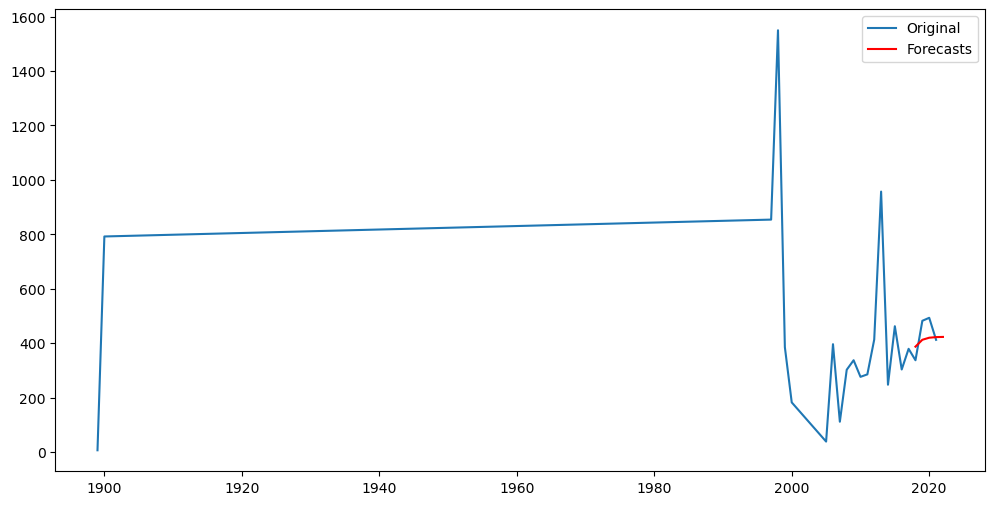

MAE: 45.423455778613665
RMSE: 54.30332134806747


In [26]:
# Splitting data into train and test sets
train = yearly_data['Tree_Count'][:-5]
test = yearly_data['Tree_Count'][-5:]

# Fit model on train data
model = ARIMA(train, order=(1,1,1))
model_fit = model.fit()

# Forecast
forecasts = model_fit.forecast(steps=5)

# Visualization of the forecast alongside actual data
plt.figure(figsize=(12,6))
plt.plot(yearly_data['Tree_Count'], label='Original')
plt.plot(pd.date_range(start=test.index[0], periods=5, freq='A'), forecasts, label='Forecasts', color='red')
plt.legend()
plt.show()

# Calculate accuracy metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error

mae = mean_absolute_error(test, forecasts)
rmse = mean_squared_error(test, forecasts, squared=False)
print('MAE:', mae)
print('RMSE:', rmse)

## Conclusion

This study has successfully traced the historical changes in tree diversity in the Melbourne area from pre-colonial times to the present, offering a unique longitudinal perspective on urban biodiversity. The findings highlight significant losses in native species diversity, pointing to the urban expansion and changing land use as key drivers of these changes. Notably, several species identified from the pre-colonial data are no longer present in contemporary records, suggesting potential local extinctions or severe declines in their populations.

The comparative analysis provided by this study is crucial for framing future conservation efforts. By identifying species that have been lost or are in decline, we can prioritize these for reintroduction in urban forestry initiatives. The study's recommendations for tree planting programs are intended to guide local councils in making informed decisions that could help restore the ecological balance and enhance urban biodiversity.

The impact of this research extends beyond academic circles, providing actionable insights for urban planners and conservationists looking to incorporate biodiversity considerations into their projects. As cities continue to grow, integrating such ecological data will be key to developing greener, more sustainable urban environments that support a wide array of plant and animal life.

## References

1. Vic.gov.au. (2022). Pre-colonial plant list. [online] Available at: https://data.melbourne.vic.gov.au/explore/dataset/pre-colonial-plant-list/information/ [Accessed 2 May 2024].
2. Vic.gov.au. (2023). Trees, with species and dimensions (Urban Forest). [online] Available at: https://data.melbourne.vic.gov.au/explore/dataset/trees-with-species-and-dimensions-urban-forest/information/ [Accessed 2 May 2024].
3. Numpy.org. (2023). NumPy -. [online] Available at: https://numpy.org/ [Accessed 2 May 2024].
4. Pydata.org. (2024). pandas - Python Data Analysis Library. [online] Available at: https://pandas.pydata.org/ [Accessed 2 May 2024].
5. PyPI. (2024). folium. [online] Available at: https://pypi.org/project/folium/ [Accessed 2 May 2024].
6. Brownlee, J. (2017). How to Create an ARIMA Model for Time Series Forecasting in Python - MachineLearningMastery.com. [online] MachineLearningMastery.com. Available at: https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/ [Accessed 2 May 2024].
7. Pydata.org. (2024). seaborn: statistical data visualization — seaborn 0.13.2 documentation. [online] Available at: https://seaborn.pydata.org/ [Accessed 2 May 2024].‌